# Projekt 1 część 1 - EDA

### Wczytanie potrzebnych bibliotek i danych

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df_all = pd.read_csv('../data/Dry_Bean_Dataset.csv')

### Podzielenie danych na zbiór trenujący i walidacyjny

In [5]:
from sklearn.model_selection import train_test_split

X = df_all.drop('Class', axis=1)
y = np.array(df_all['Class'])

X_train, X_val, y_train, y_val = train_test_split(df_all.drop('Class', axis=1), df_all['Class'],
                                                  test_size=0.3, random_state=42, stratify=y)

X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.3, random_state=42, stratify=y_train)

df = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)
df_val = pd.concat([X_val, y_val], axis=1)

### Sprawdzenie czy podział jest spoko 

<Axes: >

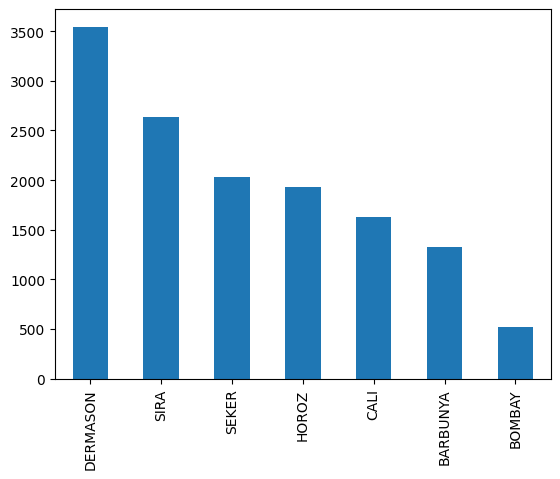

In [8]:
pd.Series(y).value_counts().plot(kind='bar')

<Axes: >

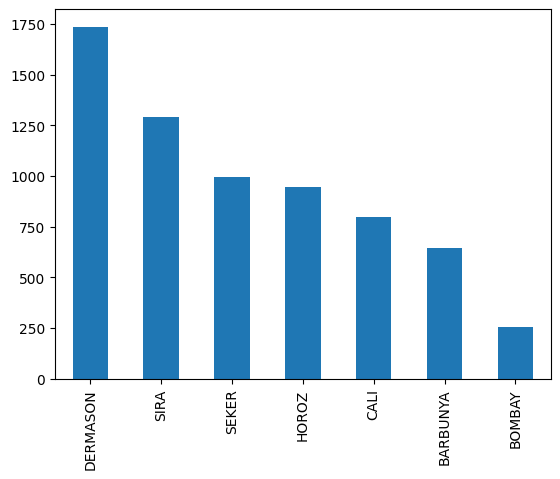

In [9]:
pd.Series(y_train).value_counts().plot(kind='bar')

<Axes: >

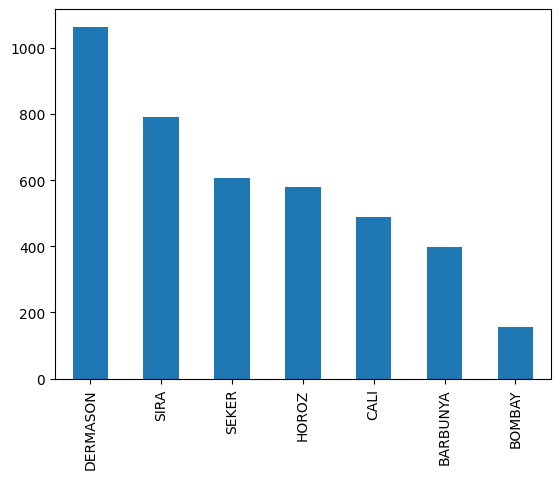

In [5]:
pd.Series(y_val).value_counts().plot(kind='bar')

<Axes: >

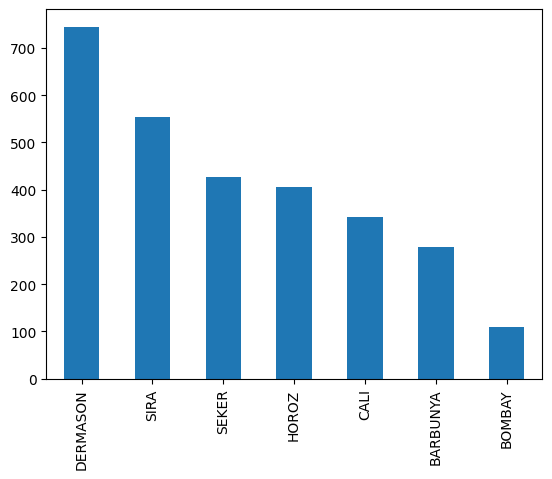

In [10]:
pd.Series(y_test).value_counts().plot(kind='bar')

Stosunek klas jest bardzo zbliżony czyli fajnie

### Zapisanie podziału danych do plików


In [11]:
df.to_csv('df_train.csv', index=False)
df_test.to_csv('df_test.csv', index=False)
df_val.to_csv('df_validate.csv', index=False)

### Jakieś opisy danych

In [10]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000,9527.000000
mean,53040.261048,855.348281,320.209925,202.186193,1.583961,0.751260,53760.587593,253.039286,0.749517,0.987118,0.872997,0.799660,0.006566,0.001715,0.643252,0.995060
std,29316.037320,214.451486,85.868949,44.871319,0.246403,0.091597,29763.896613,59.198356,0.048997,0.004693,0.059539,0.061615,0.001128,0.000595,0.098809,0.004396
min,20420.000000,524.932000,183.601165,129.576207,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.645368,0.002778,0.000567,0.416499,0.947687
25%,36299.500000,703.383500,253.114500,175.548474,1.433645,0.716563,36684.500000,214.983625,0.718343,0.985641,0.831863,0.761968,0.005898,0.001152,0.580595,0.993701
50%,44593.000000,793.897000,296.569118,192.417830,1.551509,0.764576,45131.000000,238.280446,0.759137,0.988265,0.882757,0.801120,0.006648,0.001698,0.641794,0.996393
75%,61332.000000,977.939500,376.573025,217.038627,1.709293,0.811006,62305.000000,279.446467,0.786720,0.989998,0.916977,0.833788,0.007279,0.002170,0.695202,0.997875
max,254616.000000,1985.370000,738.860154,460.198497,2.388873,0.908167,263261.000000,569.374358,0.866195,0.994677,0.986812,0.987303,0.009897,0.003665,0.974767,0.999709


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9527 entries, 11380 to 7270
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             9527 non-null   int64  
 1   Perimeter        9527 non-null   float64
 2   MajorAxisLength  9527 non-null   float64
 3   MinorAxisLength  9527 non-null   float64
 4   AspectRation     9527 non-null   float64
 5   Eccentricity     9527 non-null   float64
 6   ConvexArea       9527 non-null   int64  
 7   EquivDiameter    9527 non-null   float64
 8   Extent           9527 non-null   float64
 9   Solidity         9527 non-null   float64
 10  roundness        9527 non-null   float64
 11  Compactness      9527 non-null   float64
 12  ShapeFactor1     9527 non-null   float64
 13  ShapeFactor2     9527 non-null   float64
 14  ShapeFactor3     9527 non-null   float64
 15  ShapeFactor4     9527 non-null   float64
 16  Class            9527 non-null   object 
dtypes: float64

##### brak braków danych :)

### Opis danych


| Variable Name     | Type     | Description                                                                              |
|-------------------|----------|------------------------------------------------------------------------------------------|
| Area              | Numeric  | The area of a bean zone and the number of pixels within its boundaries.                  |
| Perimeter         | Numeric  | Bean circumference is defined as the length of its border.                               |
| MajorAxisLength   | Numeric  | The distance between the ends of the longest line that can be drawn from a bean.          |
| MinorAxisLength   | Numeric  | The longest line that can be drawn from the bean while standing perpendicular to the main axis. |
| AspectRatio       | Numeric  | Defines the relationship between MajorAxisLength and MinorAxisLength.                      |
| Eccentricity      | Numeric  | Eccentricity of the ellipse having the same moments as the region.                        |
| ConvexArea        | Numeric  | Number of pixels in the smallest convex polygon that can contain the area of a bean seed. |
| EquivDiameter     | Numeric  | The diameter of a circle having the same area as a bean seed area.                       |
| Extent            | Numeric  | The ratio of the pixels in the bounding box to the bean area.                             |
| Solidity          | Numeric  | Also known as convexity. The ratio of the pixels in the convex shell to those found in beans. |
| Roundness         | Numeric  | Calculated with the formula: (4π * Area) / (Perimeter^2).                                  |
| Compactness       | Numeric  | Measures the roundness of an object: Eccentricity divided by AspectRatio.                 |
| Shape Factor 1    | Numeric  | One of the shape factors.                                                                 |
| Shape Factor 2    | Numeric  | One of the shape factors.                                                                 |
| Shape Factor 3    | Numeric  | One of the shape factors.                                                                 |
| Shape Factor 4    | Numeric  | One of the shape factors.                                                                 |
| Class             | Categorical | One of 7 different bean types.                                                           |


#### Wielkość
- Area
- Perimeter
- MajorAxisLength
- MinorAxisLength
- EquivDiameter
- ConvexArea


#### Kształt 
- AspectRatio
- Eccentricity
- Extent
- Solidity
- Roundness
- Compactness
- 4 Shape factors

# Jakieś wykresy


## Zmienna celu 


<Axes: xlabel='None', ylabel='Class'>

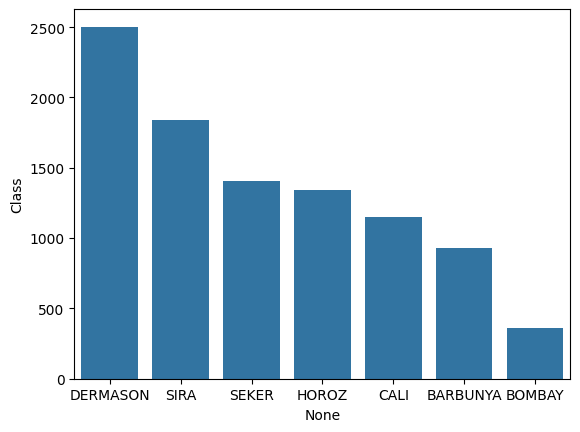

In [12]:
sns.barplot(x=df['Class'].value_counts().index, y=df['Class'].value_counts().sort_values(ascending=False))

## Rozkłady danych i wgl

In [13]:
plt.style.use('default')

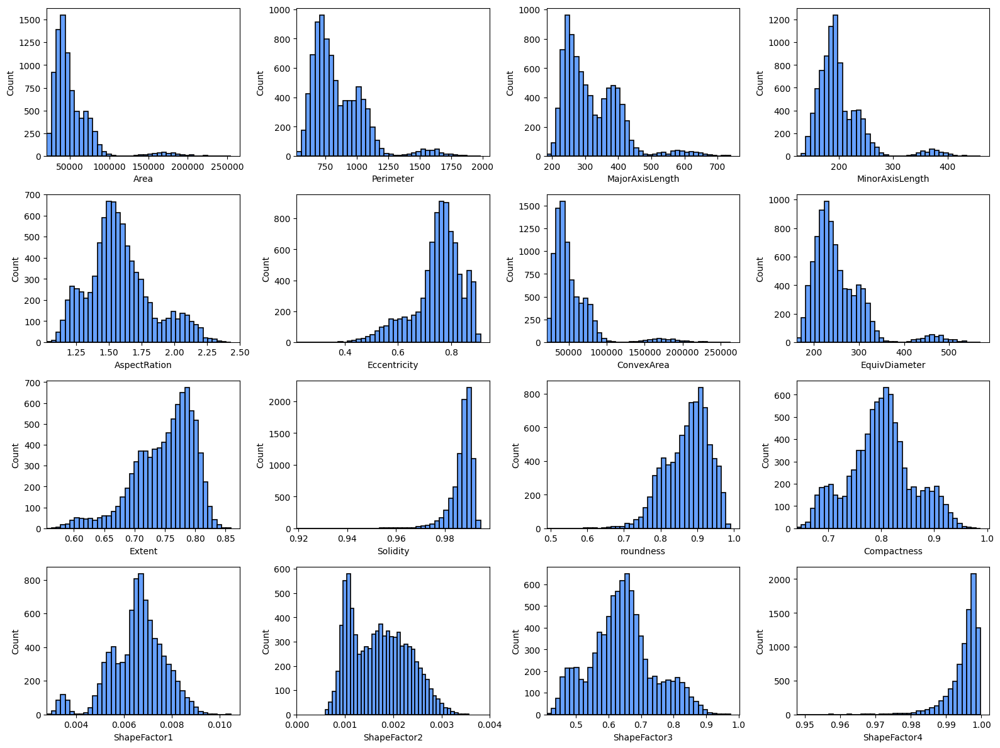

In [56]:
numeric_cols = df.select_dtypes(include=[np.number]).columns.to_list()
fig, axs = plt.subplots(4, 4, figsize=(16, 12))
axs = axs.flatten()
k = np.floor(np.sqrt(df.shape[0])).astype(int)
k2 = np.floor(2*np.cbrt(df.shape[0])).astype(int)
for i, col in enumerate(numeric_cols):
    sns.histplot(df[col], ax=axs[i], bins=k2, color='#3381ff', edgecolor='black', linewidth=1.2)
    axs[i].set_xlim(left=min(df[col]))
    if col == 'ShapeFactor2':
        ticks = axs[i].get_xticks()
        axs[i].set_xticks(ticks[::len(ticks)//3]) 

plt.tight_layout()

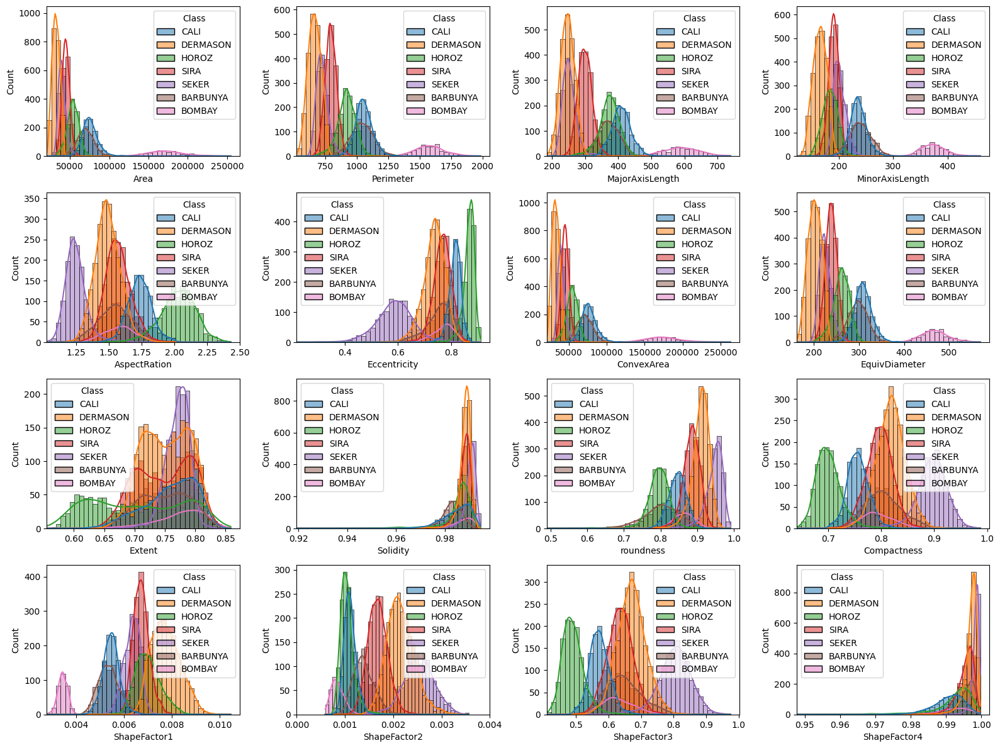

In [45]:
fig, axs = plt.subplots(4, 4, figsize=(16, 12))
axs = axs.flatten()
k = np.floor(np.sqrt(df.shape[0])).astype(int)
k2 = np.floor(2*np.cbrt(df.shape[0])).astype(int)
for i, col in enumerate(numeric_cols):
    sns.histplot(df, x=df[col], ax=axs[i], bins=k2, hue='Class', kde=True)
    axs[i].set_xlim(left=min(df[col]))
    if col == 'ShapeFactor2':
        ticks = axs[i].get_xticks()
        axs[i].set_xticks(ticks[::len(ticks)//3]) 

plt.tight_layout()

Fasola typu 'BOMBAY' zdecydowanie wyróżnia się patrząc na atrybuty dotyczące wielkości
a fasola typu 'HOROZ' patrząc na niektóre atrybuty dotyczące kształtu

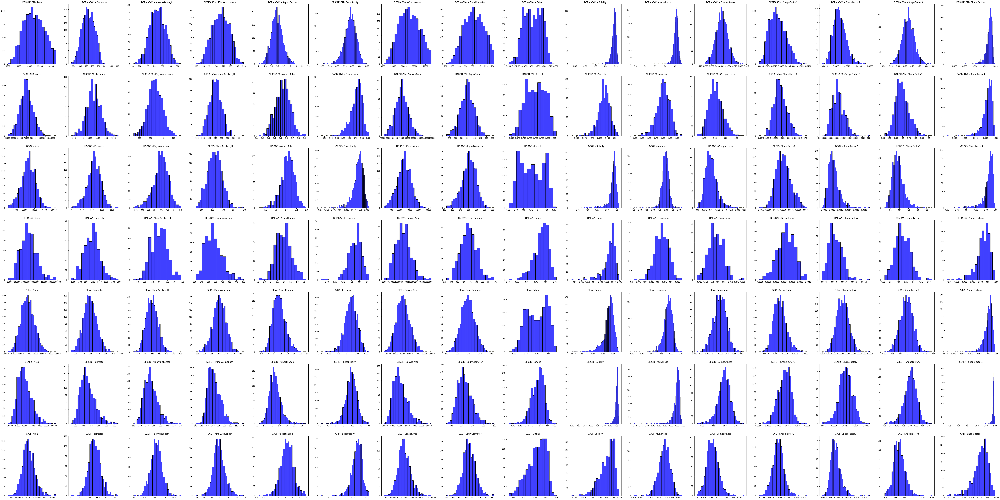

In [16]:
classes = df['Class'].unique()
numeric_cols = df.select_dtypes(include=[np.number]).columns.to_list()
fig, axs = plt.subplots(classes.size, len(numeric_cols), figsize=(100, 50))
for i, class_ in enumerate(classes):
    for j, col in enumerate(numeric_cols):
        sns.histplot(df[df['Class'] == class_][col], ax=axs[i, j], color='blue', label=class_)
        axs[i, j].set_title(f'{class_} - {col}')
        axs[i, j].set_xlabel('')
        axs[i, j].set_ylabel('')
        axs[i, j].legend().remove()

axs = axs.flatten()

Zdecydowana większość kolumn dla każdej z rodzajów fasoli ma rozkład zbliżony do normalnego.

## Boxploty dla wyróżnionych cech

<Axes: xlabel='Class', ylabel='Area'>

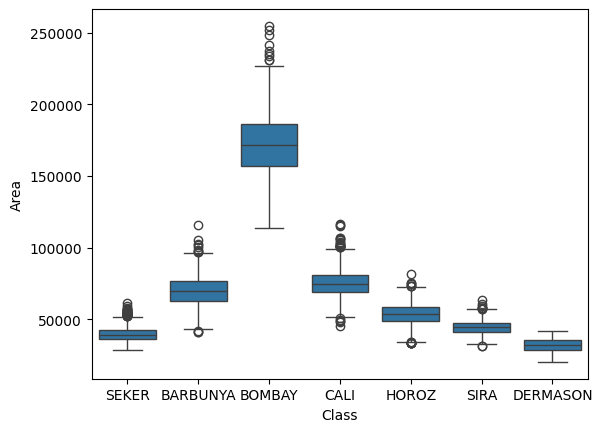

In [ ]:
sns.boxplot(data=df, x='Class', y='Area')

<Axes: xlabel='Class', ylabel='Extent'>

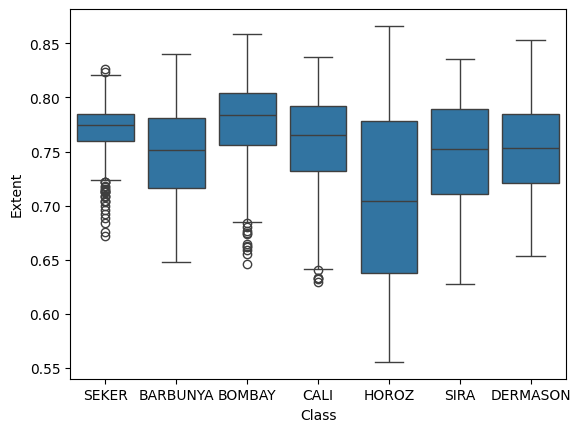

In [ ]:
sns.boxplot(data=df, x='Class', y='Extent')

<Axes: xlabel='Class', ylabel='Solidity'>

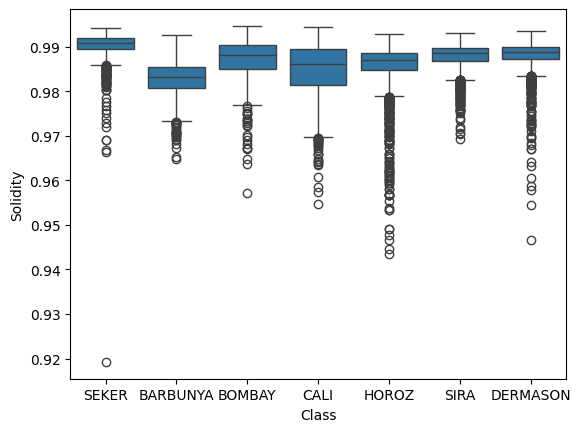

In [ ]:
sns.boxplot(data=df, x='Class', y='Solidity')

<Axes: xlabel='Class', ylabel='roundness'>

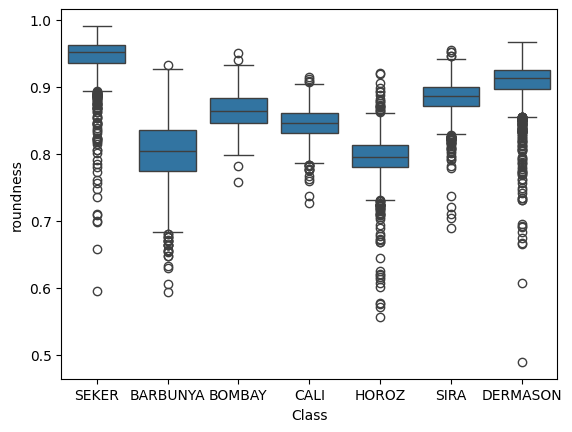

In [ ]:
sns.boxplot(data=df, x='Class', y='roundness')

<Axes: xlabel='Class', ylabel='ShapeFactor4'>

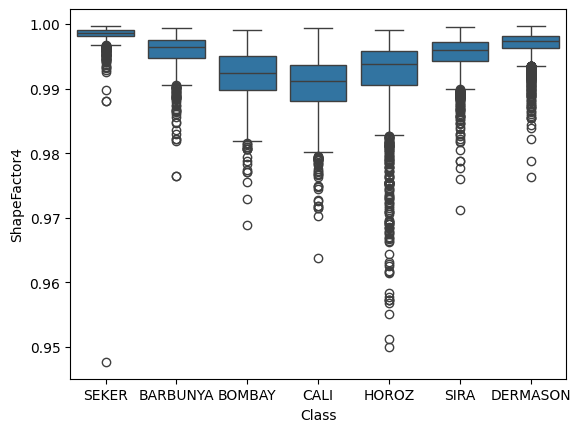

In [ ]:
sns.boxplot(data=df, x='Class', y='ShapeFactor4')

Widzimy że w niektórych kolumnach występuje dość dużo wartości odstających

 ## Tu taki rozkład każdy z każdym żeby nie trzeba było robić ręcznie miliona wykresów a żeby można było zobaczyć na szybko jakieś ciekawe zależności

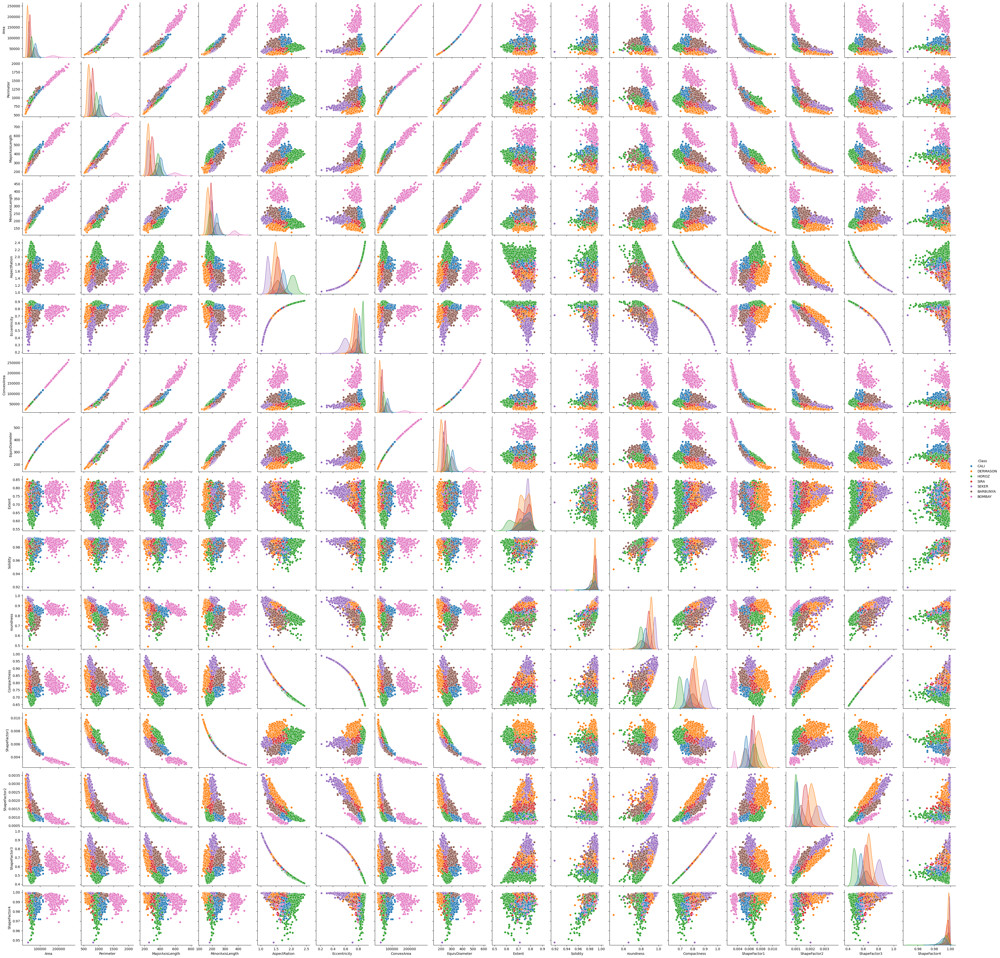

In [ ]:
sns.pairplot(df, hue='Class')

## A tu heatmapa :)

<Axes: >

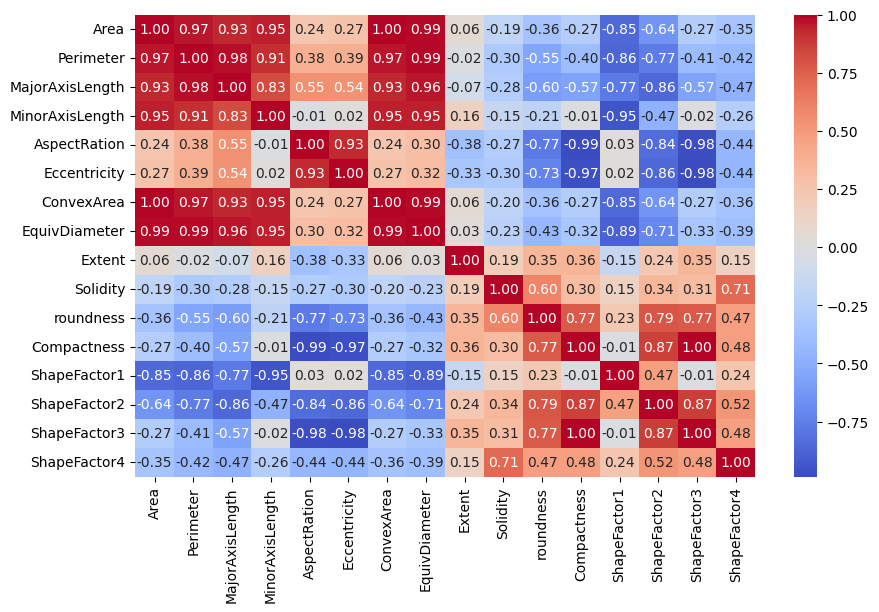

In [47]:
num_cols = df.select_dtypes(include=np.number).columns.to_list()
corr = df[num_cols].corr()
plt.figure(figsize=(10, 6))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')

<Axes: >

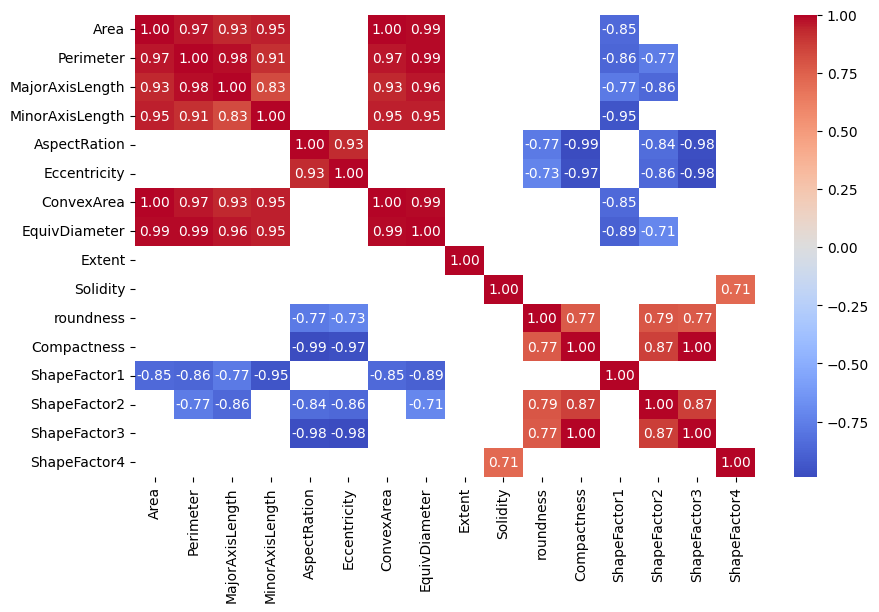

In [52]:
mask = abs(corr) < 0.7
plt.figure(figsize=(10, 6))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='coolwarm')

Bardzo dużą dodatnią korelację mają ze sobą kolumny które związane są z rozmiarem ziaren fasoli (na przykład Area i Perimeter) czego można byłoby się spodziewać

### Random forest


In [18]:
from sklearn.ensemble import RandomForestClassifier

feature_names = [feature for feature in df.columns if feature != 'Class']
forest = RandomForestClassifier(random_state=311)
forest.fit(X_train, y_train)

RandomForestClassifier(random_state=311)

<Axes: >

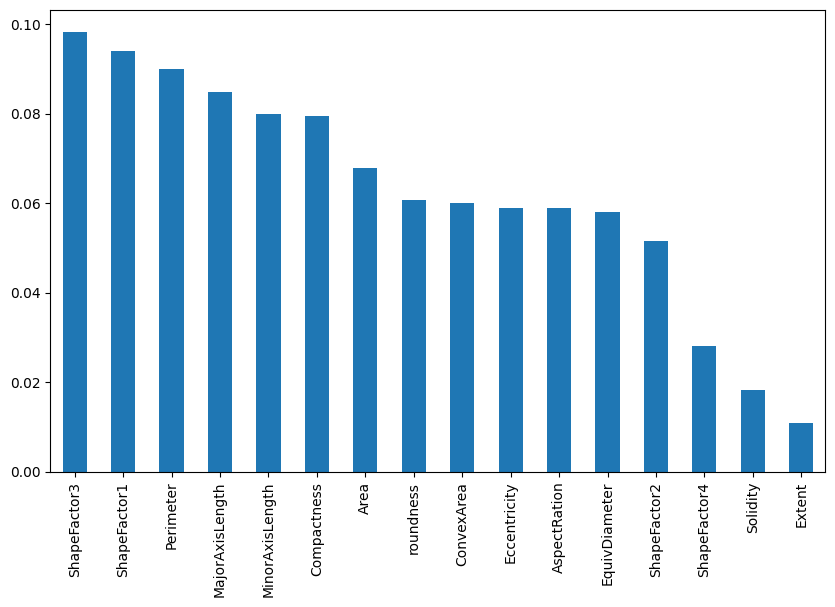

In [20]:
importances = forest.feature_importances_
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots(figsize=(10, 6))
forest_importances.sort_values(ascending=False).plot.bar(ax=ax)

In [6]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

df['Class'] = le.fit_transform(df['Class'])

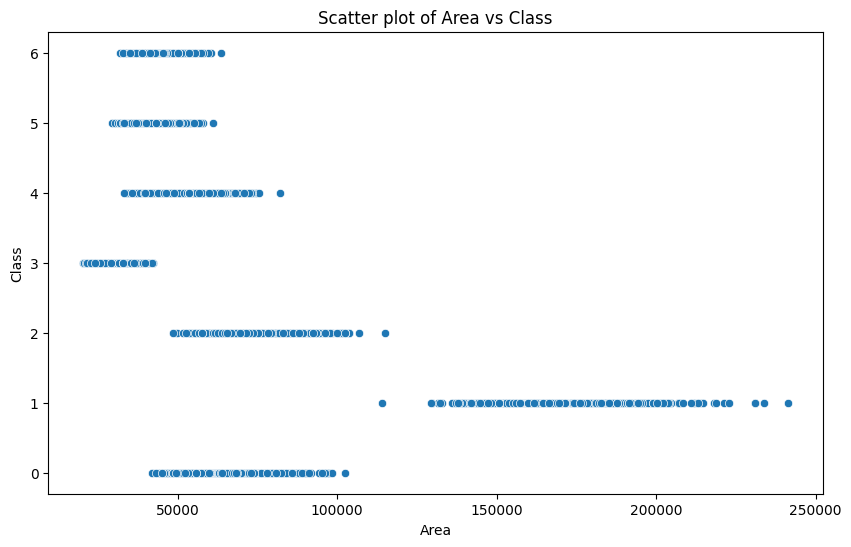

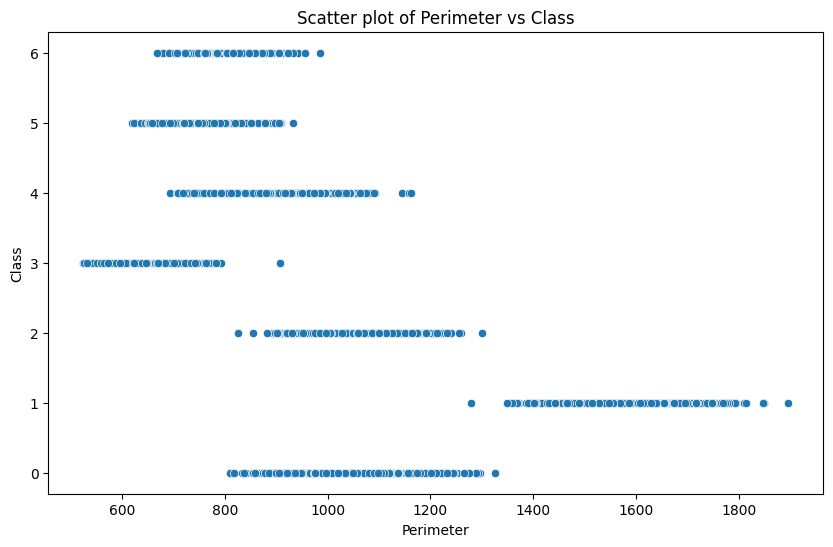

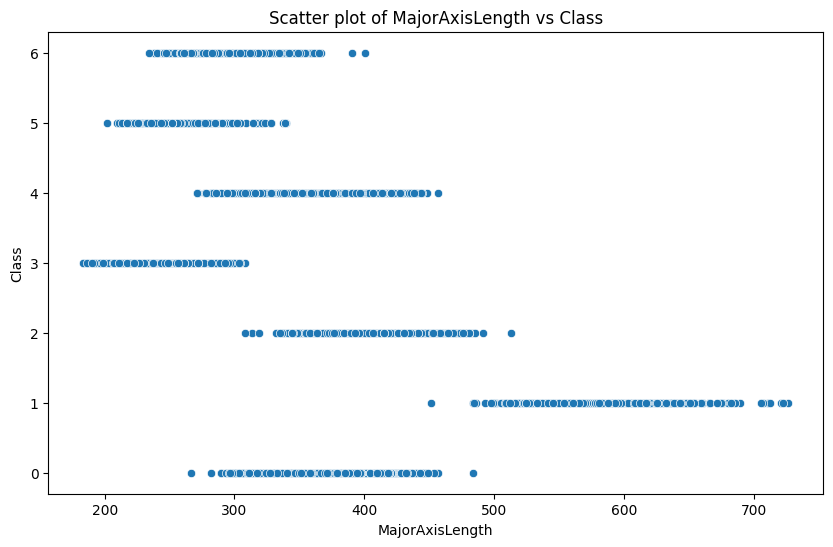

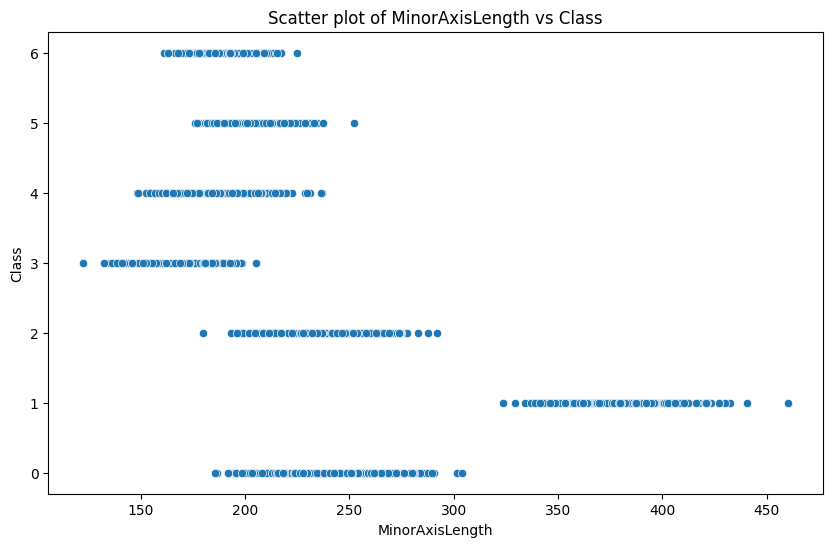

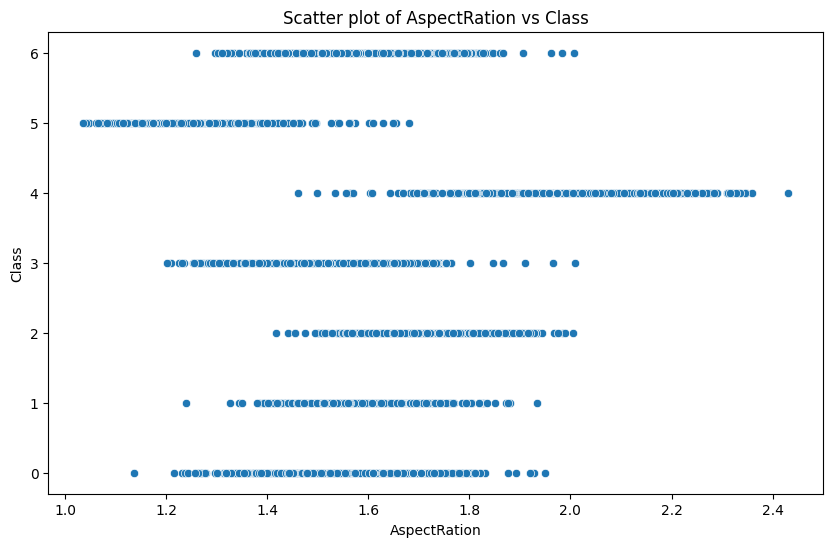

...

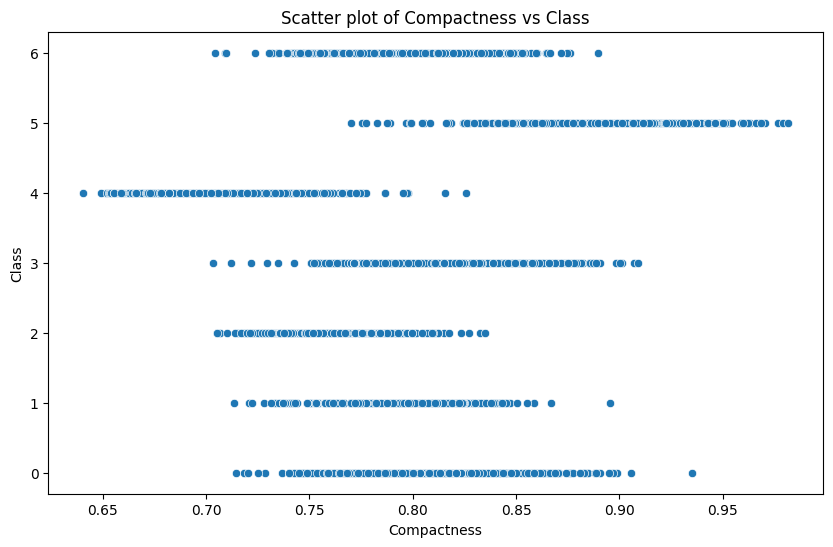

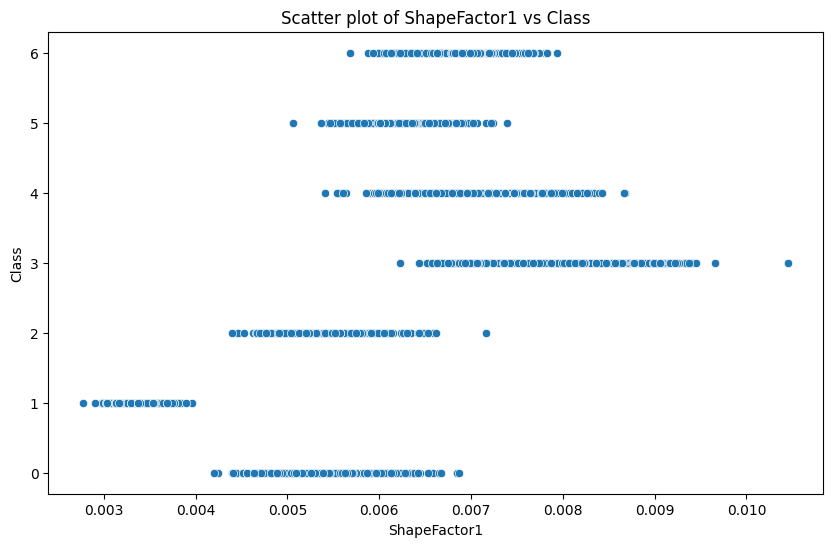

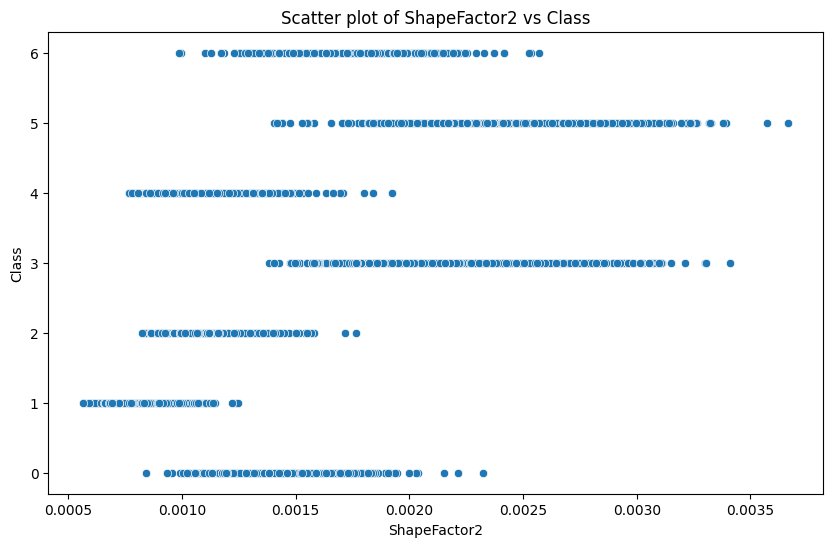

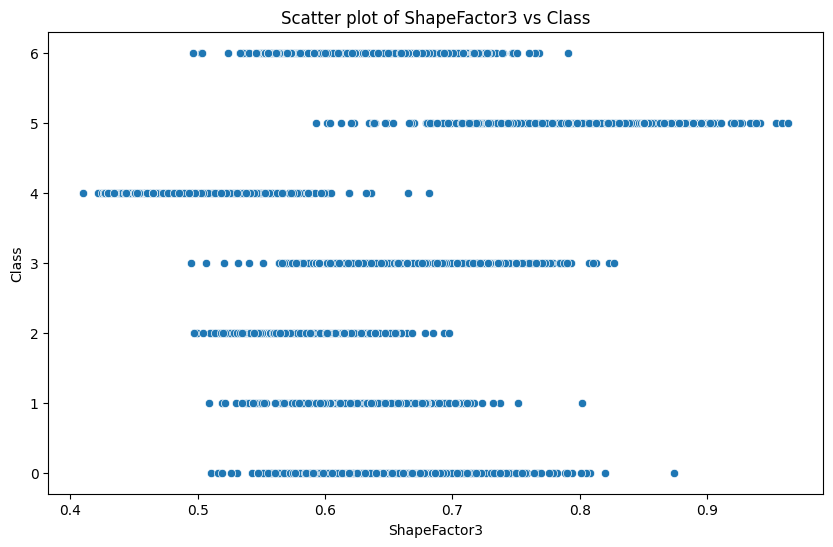

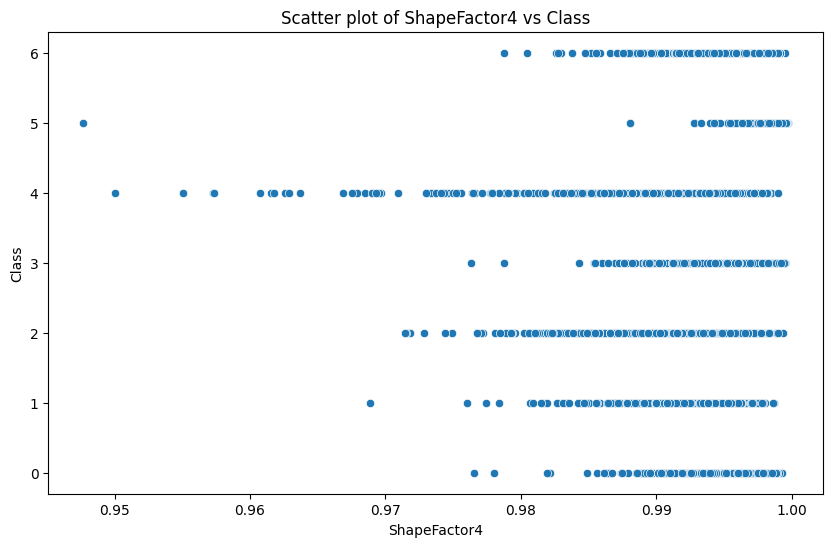

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

features = df.columns[:-1]  # wszystkie cechy oprócz ostatniej, która jest klasą
class_col = df.columns[-1]  # ostatnia kolumna, która jest klasą

for feature in features:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x=feature, y=class_col)
    plt.title(f'Scatter plot of {feature} vs {class_col}')
    plt.show()